<a href="https://colab.research.google.com/github/Boppitystar/rain-diffusion-model2025/blob/main/Rain_Diffusion_Fine_Tuning_Code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Rain Diffusion Prior to Training**

An attempt to optimize the rain removal without training

In [ ]:
import torch
from diffusers import AutoPipelineForImage2Image
from diffusers.utils import load_image, make_image_grid
import matplotlib.pyplot as plt


pipeline = AutoPipelineForImage2Image.from_pretrained(
    "stable-diffusion-v1-5/stable-diffusion-v1-5", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
)
#pipeline.enable_model_cpu_offload()

#pipeline.unet.config["in_channels"]
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
#pipeline.enable_xformers_memory_efficient_attention()

#print(torch.__version__)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [ ]:
from PIL import Image
import numpy as np # Added import for plt
from torchvision.transforms import ToTensor # Added import



file_path = '/content/0_rain.png'
init_image = Image.open(file_path).convert("RGB").resize((512, 512))

# Convert PIL Image to tensor, convert to float16, and move to GPU
init_image_tensor = ToTensor()(init_image).unsqueeze(0).half().to('cuda') # Convert, add batch dim, convert to float16, and move to cuda


prompt = "help me derain"
negative_prompt = " poor details, blurry, raindrops"

image_1 = pipeline(
    prompt,
    negative_prompt = negative_prompt,
    image=init_image_tensor,
    strength = 0.3,
    guidance_scale=8.0,
    num_inference_steps = 50,
    output_type="latent"
    ).images[0] # Use the tensor input

#make_image_grid([init_image, image], rows=1, cols=2)

Enhancement pipeline

In [ ]:
from diffusers import StableDiffusionLatentUpscalePipeline

upscaler = StableDiffusionLatentUpscalePipeline.from_pretrained(
    "stabilityai/sd-x2-latent-upscaler", torch_dtype=torch.float16, use_safetensors=True
)
upscaler.enable_model_cpu_offload()
#upscaler.enable_xformers_memory_efficient_attention()

image_2 = upscaler(prompt, image=image_1).images[0]

model_index.json:   0%|          | 0.00/408 [00:00<?, ?B/s]

Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/645 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/301 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/831 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.49G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/653 [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/debugpy/_vendored/pydevd/_pydevd_bundle/pydevd_safe_repr.py:128: FutureWarning: Accessing config attribute `__iter__` directly via 'UNet2DModel' object attribute is deprecated. Please access '__iter__' over 'UNet2DModel's config object instead, e.g. 'unet.config.__iter__'.
  if not hasattr(obj, "__iter__"):
/usr/local/lib/python3.11/dist-packages/diffusers/configuration_utils.py:141: FutureWarning: Accessing config attribute `__iter__` directly via 'StableDiffusionImg2ImgPipeline' object attribute is deprecated. Please access '__iter__' over 'StableDiffusionImg2ImgPipeline's config object instead, e.g. 'scheduler.config.__iter__'.
  deprecate("direct config name access", "1.0.0", deprecation_message, standard_warn=False)
/usr/local/lib/python3.11/dist-packages/diffusers/configuration_utils.py:141: FutureWarning: Accessing config attribute `__iter__` directly via 'DDPMScheduler' object attribute is deprecated. Please access '__iter__' over 'DDPMSc

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

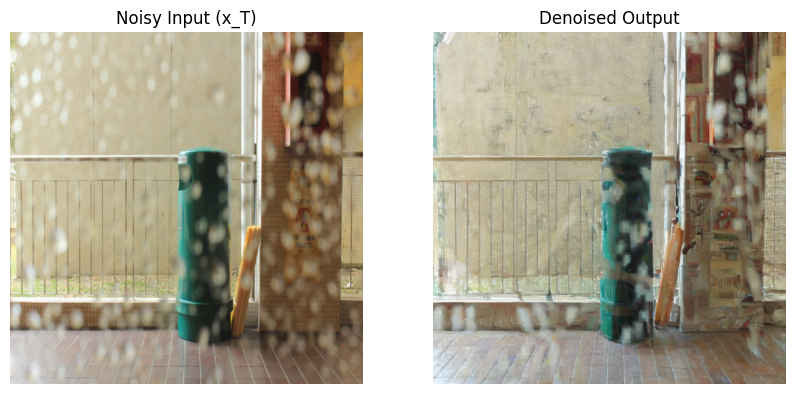

In [ ]:
# Step 5: Visualize Results
plt.figure(figsize=(12, 8), dpi=300) # Adjust figure size in inches for printing
plt.subplot(1, 2, 1)
plt.title("Noisy Input (x_T)", fontsize=20)
plt.imshow(np.array(init_image))
plt.axis("off")
plt.subplot(1, 2, 2)
plt.title("Denoised Output", fontsize=20)
plt.imshow(np.array(image_1))
plt.axis("off")
plt.show()

# To save the figure with a specific DPI:
# plt.savefig("denoised_output.png", dpi=300) # Example: save with 300 DPI

# **Dataset Management**

ORGANIZING RAINDROP DATASET
- importing it from drive, organizing into proper folders
- slimming it down to about 100 pairs for faster computation and saving to drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!gdown --folder https://drive.google.com/drive/folders/1HmY-ajAiwDpWfAJwHCdk1qELrmUDb4UI?usp=sharing

Retrieving folder contents
Processing file 1QqnpF9mVdODJyHGV4mpyhVQs9N4k6nWW Copy of test_a.zip
Processing file 1Hy9p2cg786zIqdkVuHZls7xk2j9SOlAJ Copy of test_b.zip
Processing file 1k-uaAF_U41i4P4xXL6JX6lnP8-mEllj9 Copy of train.zip
Retrieving folder contents completed
Building directory structure
Building directory structure completed
Downloading...
From (original): https://drive.google.com/uc?id=1QqnpF9mVdODJyHGV4mpyhVQs9N4k6nWW
From (redirected): https://drive.google.com/uc?id=1QqnpF9mVdODJyHGV4mpyhVQs9N4k6nWW&confirm=t&uuid=57428911-a15b-4345-92d6-f52e82455ef0
To: /content/Raindrop Dataset/Copy of test_a.zip
100% 63.7M/63.7M [00:01<00:00, 33.9MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1Hy9p2cg786zIqdkVuHZls7xk2j9SOlAJ
From (redirected): https://drive.google.com/uc?id=1Hy9p2cg786zIqdkVuHZls7xk2j9SOlAJ&confirm=t&uuid=408965c1-e326-4aaa-b058-5f1b37417cbf
To: /content/Raindrop Dataset/Copy of test_b.zip
100% 154M/154M [00:03<00:00, 48.6MB/s]
Downloading...
Fro

In [ ]:
import os
import zipfile

# Define the directory where the zip files were downloaded
download_dir = './Zipped Dataset' # Based on the gdown output

# List the files in the download directory to confirm the zip files are there
print(f"Files in download directory ({download_dir}):")
print(os.listdir(download_dir))

# Unzip each downloaded zip file
zip_files = ['Copy of test_a.zip', 'Copy of test_b.zip', 'Copy of train.zip']
for zip_file in zip_files:
    zip_path = os.path.join(download_dir, zip_file)
    extract_dir = os.path.join('./', os.path.splitext(zip_file)[0]) # Extract to a new folder with the zip file name

    if os.path.exists(zip_path):
        print(f"\nUnzipping {zip_file} to {extract_dir}...")
        with zipfile.ZipFile(zip_path, 'r') as zip_ref:
            zip_ref.extractall(extract_dir)
        print(f"Finished unzipping {zip_file}.")
    else:
        print(f"\nError: {zip_file} not found in {download_dir}.")

# List the contents of the extracted directories
extracted_folders = [os.path.splitext(zip_file)[0] for zip_file in zip_files]
print("\nContents of extracted folders:")
for folder in extracted_folders:
    if os.path.exists(folder):
        print(f"\n--- Contents of {folder} ---")
        # List the first 10 files in the directory
        files_in_folder = os.listdir(folder)
        print(f"Total files: {len(files_in_folder)}")
        print("First 10 files:")
        for i, item in enumerate(files_in_folder[:10]):
            print(item)
        if len(files_in_folder) > 10:
            print("...")
    else:
        print(f"\n--- Folder {folder} not found ---")

Files in download directory (./Zipped Dataset):
['Copy of train.zip', 'Copy of test_b.zip', 'Copy of test_a.zip']

Unzipping Copy of test_a.zip to ./Copy of test_a...
Finished unzipping Copy of test_a.zip.

Unzipping Copy of test_b.zip to ./Copy of test_b...
Finished unzipping Copy of test_b.zip.

Unzipping Copy of train.zip to ./Copy of train...
Finished unzipping Copy of train.zip.

Contents of extracted folders:

--- Contents of Copy of test_a ---
Total files: 2
First 10 files:
__MACOSX
test_a

--- Contents of Copy of test_b ---
Total files: 2
First 10 files:
__MACOSX
test_b

--- Contents of Copy of train ---
Total files: 2
First 10 files:
__MACOSX
train


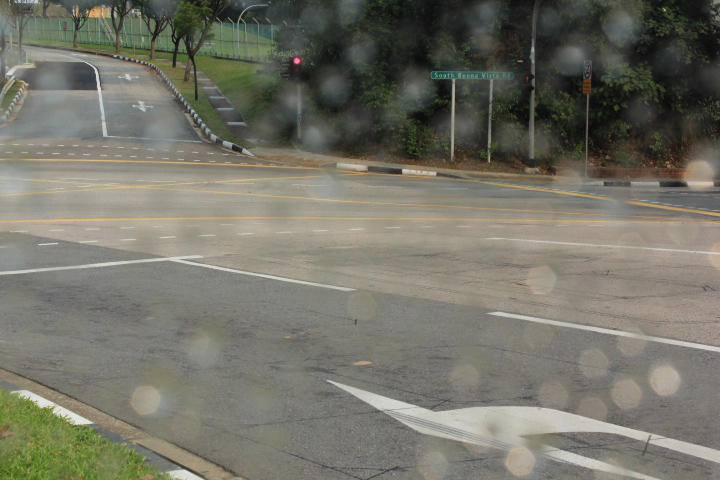

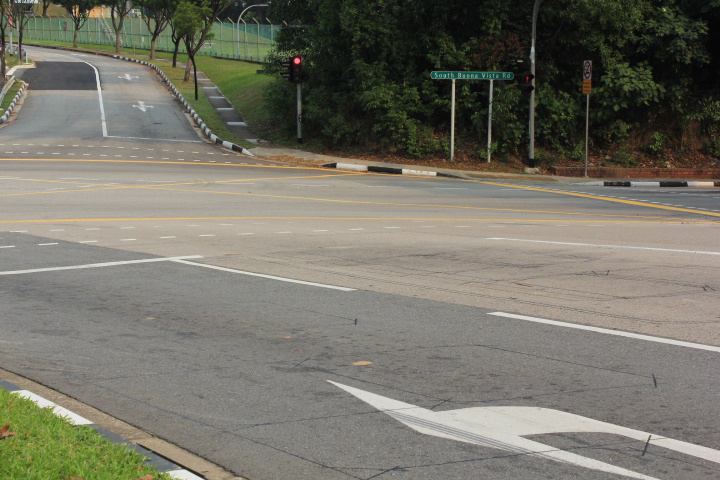

In [ ]:
from PIL import Image
import os
import matplotlib.pyplot as plt

#checking out the dataset and ground truth images
file_path_1 = './Copy of test_a/test_a/data/7_rain.png'
file_path_2 = './Copy of test_a/test_a/gt/7_clean.png'
image = Image.open(file_path_1)
image_2 = Image.open(file_path_2)

display (image)
display (image_2)

In [ ]:
import shutil
from pathlib import Path

# Base path where the unzipped files are
base_path = Path('/content/RainDrop Dataset')

# Define target paths
train_root = Path('/content/train')
test_a_root = Path('/content/test_a')
test_b_root = Path('/content/test_b')

# Create target directories
train_root.mkdir(exist_ok=True)
test_a_root.mkdir(exist_ok=True)
test_b_root.mkdir(exist_ok=True)
(train_root / 'data').mkdir(exist_ok=True)
(train_root / 'gt').mkdir(exist_ok=True)
(test_a_root / 'data').mkdir(exist_ok=True)
(test_a_root / 'gt').mkdir(exist_ok=True)
(test_b_root / 'data').mkdir(exist_ok=True)
(test_b_root / 'gt').mkdir(exist_ok=True)
# Handle test_a
test_a_path = base_path / 'Copy of test_a' / 'test_a'
if test_a_path.exists():
    shutil.copytree(test_a_path / 'data', test_a_root / 'data', dirs_exist_ok=True)
    shutil.copytree(test_a_path / 'gt', test_a_root / 'gt', dirs_exist_ok=True)
    print("Moved test_a data and gt to /content/test_a")

# Handle test_b
test_b_path = base_path / 'Copy of test_b' / 'test_b'
if test_b_path.exists():
    # For test_b, we might only need 'data' for qualitative testing; keep 'gt' if paired
    shutil.copytree(test_b_path / 'data', test_b_root / 'data', dirs_exist_ok=True)
    if (test_b_path / 'gt').exists():
        shutil.copytree(test_b_path / 'gt', test_b_root / 'gt', dirs_exist_ok=True)
    print("Moved test_b data and gt (if present) to /content/test_b")

# Handle train (assume it exists or adjust path)
train_path = base_path / 'Copy of train' / 'train' if (base_path / 'Copy of train').exists() else base_path / 'train'
if train_path.exists():
    shutil.copytree(train_path / 'data', train_root / 'data', dirs_exist_ok=True)
    shutil.copytree(train_path / 'gt', train_root / 'gt', dirs_exist_ok=True)
    print("Moved train data and gt to /content/train")
else:
    print("No train folder found. Please upload or specify the train directory.")

print("Dataset organization complete. Check /content/train and /content/test")

Moved test_a data and gt to /content/test_a
Moved test_b data and gt (if present) to /content/test_b
Moved train data and gt to /content/train
Dataset organization complete. Check /content/train and /content/test


In [ ]:
from pathlib import Path

base_path = Path('/content')
train_data = Path('/content/train/data')
train_gt = Path('/content/train/gt')
test_a_data = Path('/content/test_a/data')
test_a_gt = Path('/content/test_a/gt')
test_b_data = Path('/content/test_b/data') # Corrected path
test_b_gt = Path('/content/test_b/gt') # Corrected path

print(f"Train data images: {len(list(train_data.glob('*.png')))}")
print(f"Train gt images: {len(list(train_gt.glob('*.png')))}")
print(f"Test A data images: {len(list(test_a_data.glob('*.png')))}")
print(f"Test A gt images: {len(list(test_a_gt.glob('*.png')))}")
print(f"Test B data images: {len(list(test_b_data.glob('*.jpg')))}")
print(f"Test B gt images: {len(list(test_b_gt.glob('*.jpg')))}")

Train data images: 861
Train gt images: 861
Test A data images: 58
Test A gt images: 58
Test B data images: 249
Test B gt images: 249


In [ ]:
from pathlib import Path
print("Checking directory contents:")
for path in [Path('/content/train/data'), Path('/content/train/gt'), Path('/content/test_a/data'), Path('/content/test_a/gt')]:
    print(f"{path}: {len(list(path.glob('*.png')))} images")

Checking directory contents:
/content/train/data: 861 images
/content/train/gt: 861 images
/content/test_a/data: 58 images
/content/test_a/gt: 58 images


In [ ]:
import random
import shutil
from pathlib import Path

# Define paths
base_path = Path('/content/drive/MyDrive/Wise Research Project/Nice Raindrop Dataset')
test_a_data = Path('/content/drive/MyDrive/Wise Research Project/Nice Raindrop Dataset/test_a/data')
test_a_gt = Path('/content/drive/MyDrive/Wise Research Project/Nice Raindrop Dataset/test_a/gt')
train_data = Path('/content/drive/MyDrive/Wise Research Project/Nice Raindrop Dataset/train/data')
train_gt = Path('/content/drive/MyDrive/Wise Research Project/Nice Raindrop Dataset/train/gt')

# Create new directories for subset
subset_train = Path('/content/subset_train')
subset_test = Path('/content/subset_test')
(subset_train / 'data').mkdir(parents=True, exist_ok=True)
(subset_train / 'gt').mkdir(parents=True, exist_ok=True)
(subset_test / 'data').mkdir(parents=True, exist_ok=True)
(subset_test / 'gt').mkdir(parents=True, exist_ok=True)

# Function to get base number from filename
def get_base_number(filename):
    # Extract the number before '_rain.png' or '_clean.png'
    import re
    match = re.match(r'(\d+)_', filename)  # Matches digits before underscore
    return match.group(1) if match else None

# Select the first 100 training pairs
train_images = list(train_data.glob('*.png'))
print(f"Found {len(train_images)} images in {train_data}")
if not train_images:
    print("Error: No images found. Check train_data path and file extensions.")
    exit()
selected_train = train_images[:min(100, len(train_images))]  # First 100 or all if fewer
for img_path in selected_train:
    print(f"Processing: {img_path}")
    base_num = get_base_number(img_path.name)
    if base_num is None:
        print(f"Warning: Could not parse base number from {img_path.name}")
        continue
    gt_filename = f"{base_num}_clean.png"
    gt_path = train_gt / gt_filename
    print(f"Looking for GT: {gt_path}")
    if gt_path.exists():
        print(f"Copying {img_path} to {subset_train / 'data' / img_path.name}")
        shutil.copy(img_path, subset_train / 'data' / img_path.name)
        print(f"Copying {gt_path} to {subset_train / 'gt' / gt_filename}")
        shutil.copy(gt_path, subset_train / 'gt' / gt_filename)
    else:
        print(f"Warning: No GT found for {img_path.name}")

# Select the first 20 test_a pairs
test_a_images = list(test_a_data.glob('*.png'))
print(f"Found {len(test_a_images)} images in {test_a_data}")
if not test_a_images:
    print("Error: No images found. Check test_a_data path and file extensions.")
    exit()
selected_test = test_a_images[:min(3, len(test_a_images))]  # First 20 or all if fewer
for img_path in selected_test:
    print(f"Processing: {img_path}")
    base_num = get_base_number(img_path.name)
    if base_num is None:
        print(f"Warning: Could not parse base number from {img_path.name}")
        continue
    gt_filename = f"{base_num}_clean.png"
    gt_path = test_a_gt / gt_filename
    print(f"Looking for GT: {gt_path}")
    if gt_path.exists():
        print(f"Copying {img_path} to {subset_test / 'data' / img_path.name}")
        shutil.copy(img_path, subset_test / 'data' / img_path.name)
        print(f"Copying {gt_path} to {subset_test / 'gt' / gt_filename}")
        shutil.copy(gt_path, subset_test / 'gt' / gt_filename)
    else:
        print(f"Warning: No GT found for {img_path.name}")

print(f"Copied {len(list((subset_train / 'data').glob('*.png')))} training pairs to /content/subset_train")
print(f"Copied {len(list((subset_test / 'data').glob('*.png')))} test pairs to /content/subset_test")

Found 861 images in /content/drive/MyDrive/Wise Research Project/Nice Raindrop Dataset/train/data
Processing: /content/drive/MyDrive/Wise Research Project/Nice Raindrop Dataset/train/data/381_rain.png
Looking for GT: /content/drive/MyDrive/Wise Research Project/Nice Raindrop Dataset/train/gt/381_clean.png
Copying /content/drive/MyDrive/Wise Research Project/Nice Raindrop Dataset/train/data/381_rain.png to /content/subset_train/data/381_rain.png
Copying /content/drive/MyDrive/Wise Research Project/Nice Raindrop Dataset/train/gt/381_clean.png to /content/subset_train/gt/381_clean.png
Processing: /content/drive/MyDrive/Wise Research Project/Nice Raindrop Dataset/train/data/327_rain.png
Looking for GT: /content/drive/MyDrive/Wise Research Project/Nice Raindrop Dataset/train/gt/327_clean.png
Copying /content/drive/MyDrive/Wise Research Project/Nice Raindrop Dataset/train/data/327_rain.png to /content/subset_train/data/327_rain.png
Copying /content/drive/MyDrive/Wise Research Project/Nice Ra

# **Attempt 1: Rain Diffusion Training with UNet Model Structure**

 most of this code is from this source, weather diffusion dataset sample code https://colab.research.google.com/drive/1A6gT37yKSIMRnAiXiEQ9gWMoWIDgBoD5?usp=sharing
which I will modify to make simplier
update: it doesn't appear to work well, outputs noise more than recognizable images due to model needing many more epochs and training in order to be trained from ground up

In [ ]:
!pip install diffusers transformers torch torchvision accelerate bitsandbytes

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 36.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 34.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 58.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 744.1 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 15.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 81.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitli

In [ ]:
from torch.utils.data import Dataset
from PIL import Image
import torchvision.transforms as T
from pathlib import Path

def build_transforms(train: bool):
    tf = []
    if train:
        tf.append(T.RandomCrop(128))  # Crop to 256x256 patches for training
    tf.extend([
        T.ToTensor(),              # Convert to tensor [0,1]
        T.Lambda(lambda x: x * 2 - 1)  # Scale to [-1,1]
    ])
    return T.Compose(tf)

def get_base_number(filename):
    import re
    match = re.match(r'(\d+)_', filename)  # Matches digits before underscore
    return match.group(1) if match else None

class DerainDataset(Dataset):
    def __init__(self, root: Path, train: bool = True):
        self.train = train
        self.tf = build_transforms(train)
        rainy_dir = root / 'data'
        self.rainy_paths = sorted(rainy_dir.glob('*_rain.png'))  # Match _rain.png files
        if train:
            clean_dir = root / 'gt'
            self.clean_paths = [clean_dir / f"{get_base_number(p.name)}_clean.png" for p in self.rainy_paths]
        else:
            self.clean_paths = [None] * len(self.rainy_paths)

    def __len__(self):
        return len(self.rainy_paths)

    def __getitem__(self, idx):
        rainy = Image.open(self.rainy_paths[idx]).convert('RGB')
        clean = None
        if self.train:
            clean = Image.open(self.clean_paths[idx]).convert('RGB')
        rainy = self.tf(rainy)
        if self.train:
            clean = self.tf(clean)
            return rainy, clean
            print("rainy and clean image paired")
        else:
            return rainy, self.rainy_paths[idx].name

In [ ]:
from diffusers import UNet2DModel, DDPMScheduler
import torch
from torch.utils.data import DataLoader
import torch.optim as optim
import torch.nn.functional as F
from torch.cuda.amp import GradScaler
from tqdm import tqdm
from google.colab import drive

# Set up device and model
batch_size = 4  #lowered for the memory
learning_rate = 1e-4
epochs = 50  #lowered for memory
use_amp = True  # Mixed precision for efficiency

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#model = UNet2DModel.from_pretrained("runwayml/stable-diffusion-v1-5", subfolder="unet", cross_attention_dim=768)
#cross attention dim is the text guidance
#model.config.in_channels = 6  # Input: noisy clean (3) + rainy (3)
#model.config.out_channels = 3  # Output: predicted noise (3 channels)


model = UNet2DModel(
    sample_size=256,
    in_channels=6,
    out_channels=3,
    layers_per_block=2,
    block_out_channels=(128, 128, 256, 256, 512, 512),
    down_block_types=("DownBlock2D", "DownBlock2D", "DownBlock2D", "DownBlock2D", "DownBlock2D", "DownBlock2D"),
    up_block_types=("UpBlock2D", "UpBlock2D", "UpBlock2D", "UpBlock2D", "UpBlock2D", "UpBlock2D"), # Corrected up_block_types
)

# Scheduler with fewer timesteps for faster training
scheduler = DDPMScheduler(num_train_timesteps=100, prediction_type="epsilon")



# DataLoader
train_ds = DerainDataset(Path('/content/drive/MyDrive/Wise Research Project/Nice Raindrop Dataset/train'), train=True)
train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=2)

# Optimizer and scaler
optimizer = optim.AdamW(model.parameters(), lr=learning_rate)
scaler = GradScaler() if use_amp else None
model.to(device)

/tmp/ipython-input-3-2537807143.py:44: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler() if use_amp else None


UNet2DModel(
  (conv_in): Conv2d(6, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=128, out_features=512, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=512, out_features=512, bias=True)
  )
  (down_blocks): ModuleList(
    (0-1): 2 x DownBlock2D(
      (resnets): ModuleList(
        (0-1): 2 x ResnetBlock2D(
          (norm1): GroupNorm(32, 128, eps=1e-05, affine=True)
          (conv1): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (time_emb_proj): Linear(in_features=512, out_features=128, bias=True)
          (norm2): GroupNorm(32, 128, eps=1e-05, affine=True)
          (dropout): Dropout(p=0.0, inplace=False)
          (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (nonlinearity): SiLU()
        )
      )
      (downsamplers): ModuleList(
        (0): Downsample2D(
          (conv): Con

In [ ]:
# Training loop
for epoch in range(1, epochs + 1):
    model.train()
    pbar = tqdm(train_loader, desc=f"Epoch {epoch}/{epochs}") #progress bar
    for rainy, clean in pbar:
        rainy, clean = rainy.to(device), clean.to(device)
        bs = rainy.shape[0] #batch size
        t = torch.randint(0, scheduler.config.num_train_timesteps, (bs,), device=device)
        #randomly generate number of timesteps to determine level of noise added to clean image in this iteration

        noise = torch.randn_like(clean)
        noisy = scheduler.add_noise(clean, noise, t) #adds the generated noise to the clean image according to t
        inp = torch.cat([noisy, rainy], dim=1)  # Concatenate noisy clean + rainy for the unet channels

        if use_amp:
            with torch.amp.autocast('cuda'):
                pred = model(inp, t).sample
                loss = F.mse_loss(pred, noise)
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad()
        else:
            pred = model(inp, t).sample #forward pass predicts noise added to clean image
            loss = F.mse_loss(pred, noise)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()

        pbar.set_postfix(loss=f"{loss.item():.4f}")




Epoch 1/50:  25%|██▌       | 55/216 [01:34<04:03,  1.52s/it, loss=0.5389]/usr/local/lib/python3.11/dist-packages/debugpy/_vendored/pydevd/_pydevd_bundle/pydevd_safe_repr.py:128: FutureWarning: Accessing config attribute `__iter__` directly via 'UNet2DModel' object attribute is deprecated. Please access '__iter__' over 'UNet2DModel's config object instead, e.g. 'unet.config.__iter__'.
  if not hasattr(obj, "__iter__"):
Epoch 1/50:  26%|██▌       | 56/216 [01:35<03:10,  1.19s/it, loss=0.2298]/usr/local/lib/python3.11/dist-packages/diffusers/configuration_utils.py:141: FutureWarning: Accessing config attribute `__iter__` directly via 'DDPMScheduler' object attribute is deprecated. Please access '__iter__' over 'DDPMScheduler's config object instead, e.g. 'scheduler.config.__iter__'.
  deprecate("direct config name access", "1.0.0", deprecation_message, standard_warn=False)
Epoch 1/50:  60%|█████▉    | 129/216 [02:59<01:20,  1.07it/s, loss=0.3086]/usr/local/lib/python3.11/dist-packages/deb

In [ ]:
model.save_pretrained("/content/drive/MyDrive/rain_removal_unet")
print("Model saved to /content/drive/MyDrive/rain_removal_unet")

Model saved to /content/derain_unet


plotting the loss values on graph

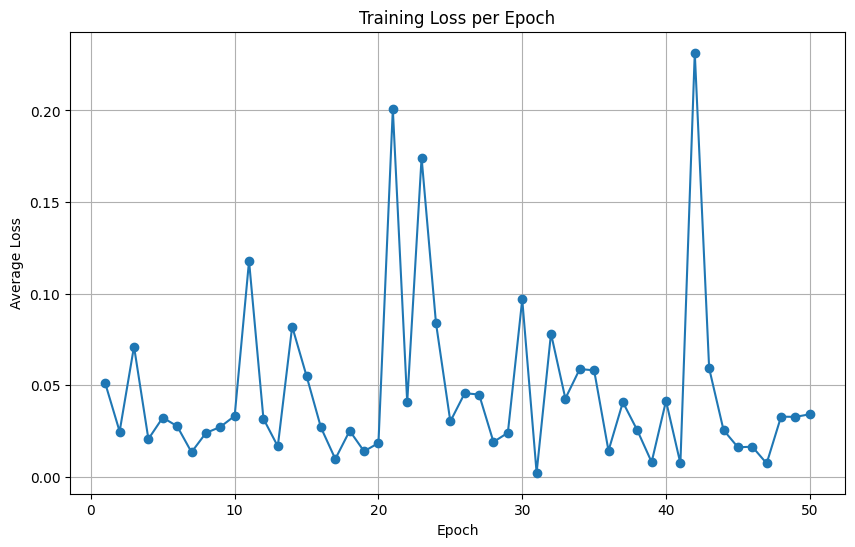

In [ ]:
import matplotlib.pyplot as plt

epoch_losses = [
    0.0510, 0.0247, 0.0711, 0.0206, 0.0323, 0.0276, 0.0134, 0.0239, 0.0272, 0.0332,
    0.1178, 0.0317, 0.0166, 0.0820, 0.0550, 0.0269, 0.0097, 0.0251, 0.0139, 0.0184,
    0.2007, 0.0406, 0.1742, 0.0840, 0.0302, 0.0456, 0.0449, 0.0190, 0.0240, 0.0968,
    0.0022, 0.0782, 0.0427, 0.0588, 0.0581, 0.0142, 0.0407, 0.0254, 0.0080, 0.0414,
    0.0073, 0.2315, 0.0592, 0.0255, 0.0161, 0.0164, 0.0073, 0.0328, 0.0327, 0.0341
]

epochs = len(epoch_losses) # Determine the number of epochs from the provided data

# Plot the loss over epochs
plt.figure(figsize=(10, 6))
plt.plot(range(1, epochs + 1), epoch_losses, marker='o', linestyle='-')
plt.title('Training Loss per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Average Loss')
plt.grid(True)
plt.show()

Model Testing

In [ ]:
from diffusers import UNet2DModel, DDPMScheduler
import torch
from torch.utils.data import DataLoader
from tqdm import tqdm
import torchvision.transforms as T
from pathlib import Path
from PIL import Image

# Add a transform for resizing test images to the model's expected input size
test_transforms = T.Compose([
    T.Resize((256, 256)),  # Resize test images to 256x256
    T.ToTensor(),              # Convert to tensor [0,1]
    T.Lambda(lambda x: x * 2 - 1)  # Scale to [-1,1]
])


# Load trained model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet2DModel.from_pretrained("/content/derain_unet")
model.to(device)
model.eval()
scheduler = DDPMScheduler(num_train_timesteps=300)

# Denoising function
def denoise_full(rainy_tensor, save_intermediate_steps=False, output_dir=None, filename_prefix="intermediate"):
    x = torch.randn_like(rainy_tensor).to(device)
    intermediate_steps_to_save = scheduler.timesteps[::scheduler.num_train_timesteps // 10] # Save ~10 steps
    saved_count = 0

    for t in tqdm(scheduler.timesteps, desc='Denoising'):
        inp = torch.cat([x, rainy_tensor], dim=1)
        with torch.no_grad():
            noise_pred = model(inp, t).sample
        x = scheduler.step(noise_pred, t, x).prev_sample

        if save_intermediate_steps and output_dir and t in intermediate_steps_to_save:
            img = (x.clamp(-1, 1) + 1) / 2  # Scale to [0,1]
            pil = T.ToPILImage()(img.squeeze(0).cpu())
            step_filename = f"{filename_prefix}_step_{t.item():03d}.png"
            pil.save(output_dir / step_filename)
            saved_count += 1
            if saved_count >= len(intermediate_steps_to_save):
                save_intermediate_steps = False # Stop saving after desired steps

    return x

# Test DataLoader
# Update the DerainDataset to use the new test_transforms
class DerainDatasetTest(Dataset): # Create a separate class for test dataset to apply different transforms
    def __init__(self, root: Path):
        self.tf = test_transforms # Use the new test transforms
        rainy_dir = root / 'data'
        self.rainy_paths = sorted(rainy_dir.glob('*_rain.png'))  # Match _rain.png files

    def __len__(self):
        return len(self.rainy_paths)

    def __getitem__(self, idx):
        rainy = Image.open(self.rainy_paths[idx]).convert('RGB')
        rainy = self.tf(rainy)
        return rainy, self.rainy_paths[idx].name

test_ds = DerainDatasetTest(Path('/content/subset_test')) # Use the new test dataset class
test_loader = DataLoader(test_ds, batch_size=1, shuffle=False)

# Save results
output_dir = Path('/content/results')
output_dir.mkdir(exist_ok=True)

intermediate_output_dir = Path('/content/intermediate_denoising_steps')
intermediate_output_dir.mkdir(exist_ok=True)

with torch.no_grad():
    for i, (rainy, name) in tqdm(enumerate(test_loader), desc='Testing'):
        rainy = rainy.to(device)

        # Save intermediate steps for the first test image
        if i == 0:
            print(f"\nSaving intermediate denoising steps for {name[0]} to {intermediate_output_dir}")
            pred = denoise_full(rainy, save_intermediate_steps=True, output_dir=intermediate_output_dir, filename_prefix=Path(name[0]).stem)
            print("Intermediate steps saved.")
        else:
            pred = denoise_full(rainy, save_intermediate_steps=False)

        img = (pred.clamp(-1, 1) + 1) / 2  # Scale to [0,1]
        pil = T.ToPILImage()(img.squeeze(0).cpu())
        pil.save(output_dir / name[0])

print("Derained images saved to /content/results")

Testing: 0it [00:00, ?it/s]


Saving intermediate denoising steps for 21_rain.png to /content/intermediate_denoising_steps



Denoising: 100%|██████████| 300/300 [00:34<00:00,  8.78it/s]
Testing: 1it [00:34, 34.29s/it]

Intermediate steps saved.



Denoising: 100%|██████████| 300/300 [00:34<00:00,  8.64it/s]
Testing: 2it [01:09, 34.61s/it]
Denoising: 100%|██████████| 300/300 [00:35<00:00,  8.49it/s]
Testing: 3it [01:44, 34.86s/it]

Derained images saved to /content/results


Displaying the results, differences and intermediate steps

Displaying original and derained images:

--- 21_rain.png ---
Original:


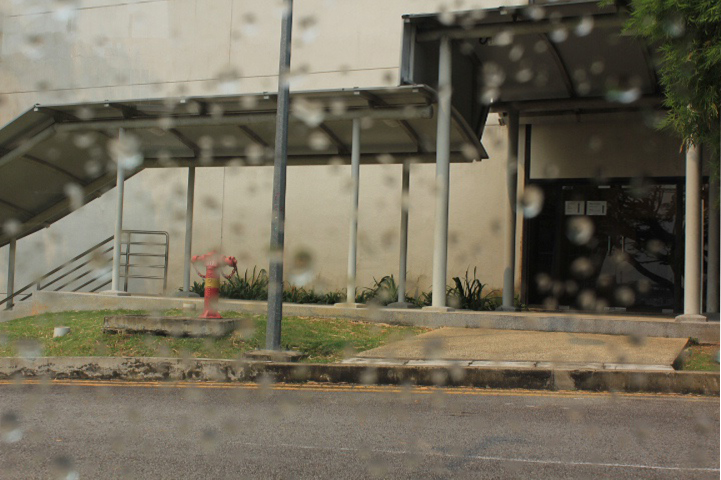

Derained:


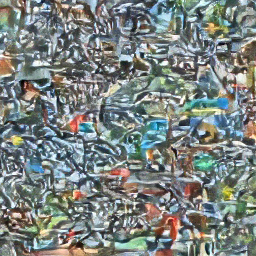


--- 25_rain.png ---
Original:


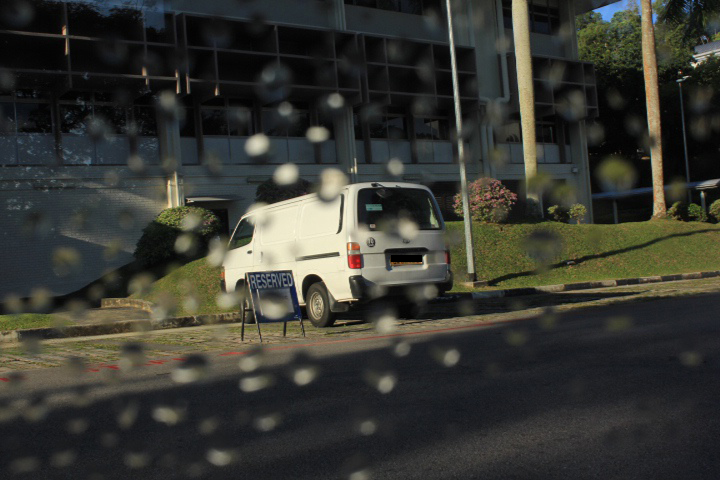

Derained:


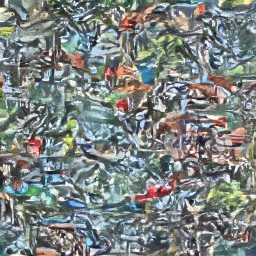


--- 36_rain.png ---
Original:


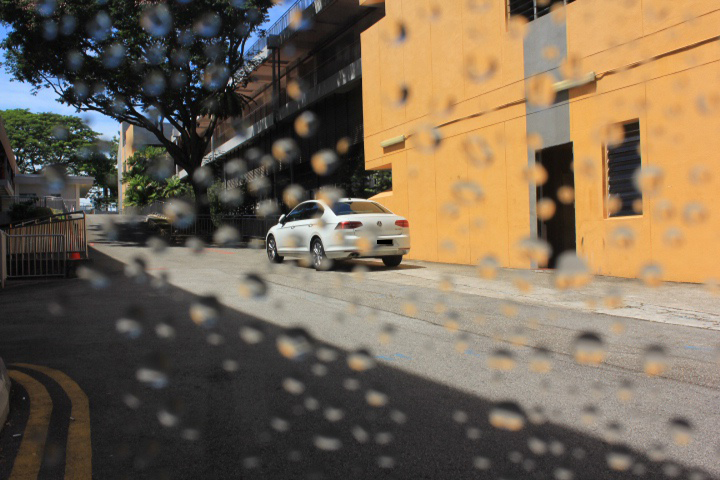

Derained:


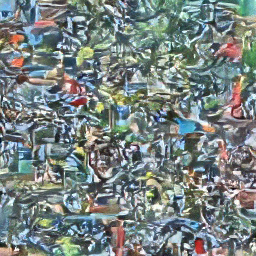



Displaying intermediate denoising steps from /content/intermediate_denoising_steps:

--- 21_rain_step_009.png ---


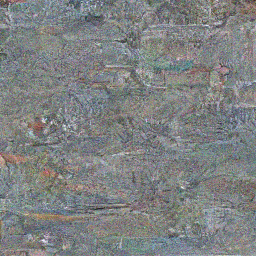


--- 21_rain_step_019.png ---


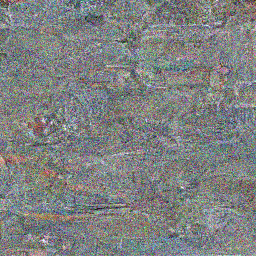


--- 21_rain_step_029.png ---


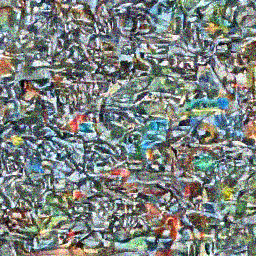


--- 21_rain_step_039.png ---


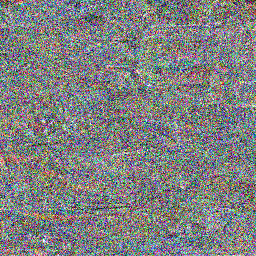


--- 21_rain_step_049.png ---


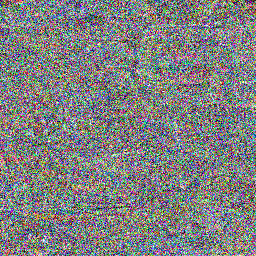


--- 21_rain_step_059.png ---


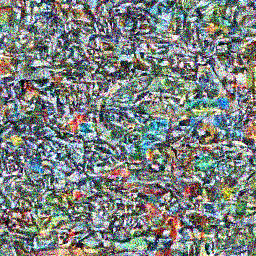


--- 21_rain_step_069.png ---


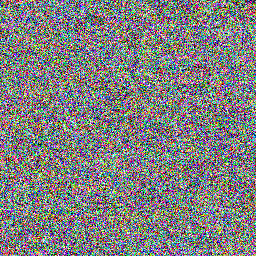


--- 21_rain_step_079.png ---


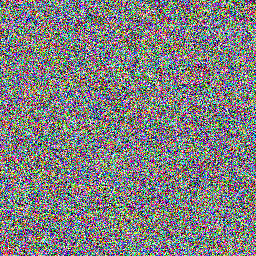


--- 21_rain_step_089.png ---


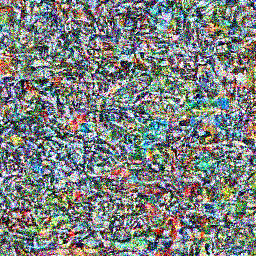


--- 21_rain_step_099.png ---


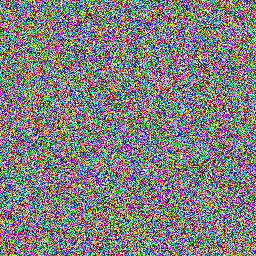


--- 21_rain_step_119.png ---


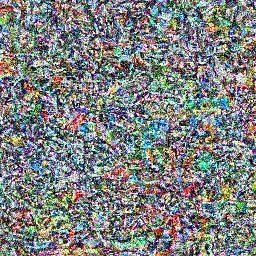


--- 21_rain_step_149.png ---


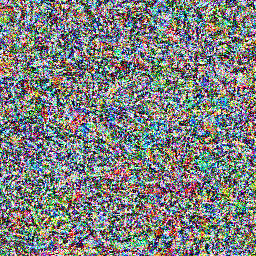


--- 21_rain_step_179.png ---


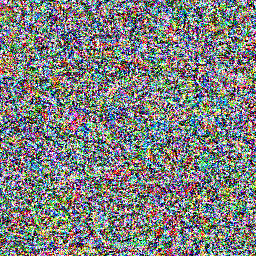


--- 21_rain_step_209.png ---


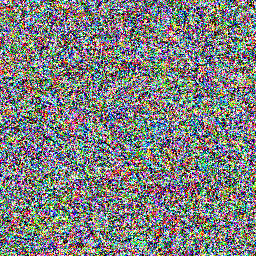


--- 21_rain_step_239.png ---


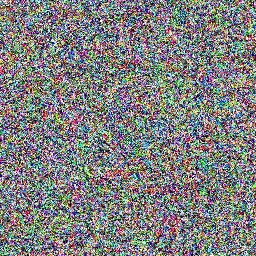


--- 21_rain_step_269.png ---


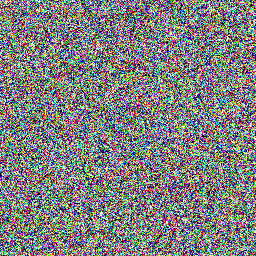


--- 21_rain_step_299.png ---


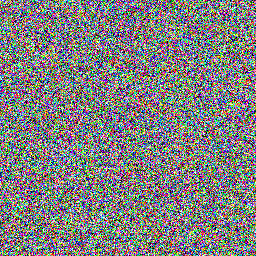

In [ ]:
import os
from IPython.display import display, Image
from pathlib import Path

original_data_dir = Path('/content/subset_test/data')
results_dir = Path('/content/results')
intermediate_output_dir = Path('/content/intermediate_denoising_steps')

print("Displaying original and derained images:")

# Check if both directories exist
if original_data_dir.exists() and results_dir.exists():
    # Get list of original rainy image files
    original_image_files = sorted([f.name for f in original_data_dir.glob('*.png')])

    if original_image_files:
        for original_file_name in original_image_files:
            original_file_path = original_data_dir / original_file_name
            derained_file_path = results_dir / original_file_name # Assuming the derained file has the same name

            if original_file_path.exists() and derained_file_path.exists():
                print(f"\n--- {original_file_name} ---")
                try:
                    # Display original and derained images side by side (this will display them sequentially)
                    print("Original:")
                    display(Image(filename=original_file_path))
                    print("Derained:")
                    display(Image(filename=derained_file_path))
                except Exception as e:
                    print(f"Could not display images for {original_file_name}: {e}")
            else:
                print(f"\nWarning: Could not find both original ({original_file_path}) or derained ({derained_file_path}) image for {original_file_name}.")

    else:
        print("No original image files found in the data directory.")
else:
    if not original_data_dir.exists():
        print(f"Original data directory not found: {original_data_dir}")
    if not results_dir.exists():
        print(f"Results directory not found: {results_dir}")

print("\n" + "="*50 + "\n") # Separator

print(f"Displaying intermediate denoising steps from {intermediate_output_dir}:")

# Check if the intermediate steps directory exists
if intermediate_output_dir.exists():
    # Get list of intermediate image files
    intermediate_image_files = sorted([f.name for f in intermediate_output_dir.glob('*.png')])

    if intermediate_image_files:
        for image_file in intermediate_image_files:
            file_path = intermediate_output_dir / image_file
            print(f"\n--- {image_file} ---")
            try:
                # Display the image
                display(Image(filename=file_path))
            except Exception as e:
                print(f"Could not display image {image_file}: {e}")
    else:
        print("No intermediate image files found in the intermediate steps directory.")
else:
    print(f"Intermediate steps directory not found: {intermediate_output_dir}")

# **Attempt 2: Rain Diffusion Huggingface Training Guided**

attempt 2 at the model structure following this hugging face guide: https://huggingface.co/docs/diffusers/main/en/tutorials/basic_training

In [ ]:
# uncomment to install the necessary libraries in Colab
!pip install diffusers[training]

useful class for storing parameters of the training and the model

In [ ]:
from dataclasses import dataclass

@dataclass
class TrainingConfig:
    image_size = 128  # the generated image resolution
    train_batch_size = 4
    eval_batch_size = 4  # how many images to sample during evaluation
    num_epochs = 5 #downscaled to start
    gradient_accumulation_steps = 1
    learning_rate = 1e-4
    lr_warmup_steps = 500
    save_image_epochs = 2
    save_model_epochs = 5
    mixed_precision = "fp16"  # `no` for float32, `fp16` for automatic mixed precision
    output_dir = "ddpm-derain-128"  # the model name locally and on the HF Hub

    #push_to_hub = True  # whether to upload the saved model to the HF Hub
    #hub_model_id = "<your-username>/<my-awesome-model>"  # the name of the repository to create on the HF Hub
    #hub_private_repo = None
    overwrite_output_dir = True  # overwrite the old model when re-running the notebook
    seed = 0 #makes the training reproducible


config = TrainingConfig()

Now to load the dataset

Resolving data files:   0%|          | 0/1722 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

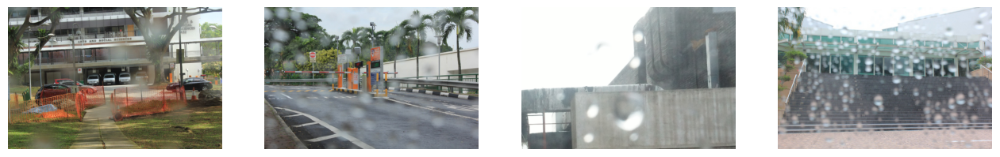

In [ ]:
from datasets import load_dataset

config.dataset_name = "/content/drive/MyDrive/Wise Research Project/Nice Raindrop Dataset/train"
dataset = load_dataset(config.dataset_name, split="train")

import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 4, figsize=(16, 4))
for i, image in enumerate(dataset[:4]["image"]):
    axs[i].imshow(image)
    axs[i].set_axis_off()
fig.show()

transforms the all the photos in the dataset to be same size and to tensors to be processed

In [ ]:
from torchvision import transforms

preprocess = transforms.Compose(
    [
        transforms.Resize((config.image_size, config.image_size)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5]),
    ]
)

def transform(examples):
    images = [preprocess(image.convert("RGB")) for image in examples["image"]]
    return {"images": images}


dataset.set_transform(transform)

def get_base_number(filename):
    import re
    match = re.match(r'(\d+)_', filename)  # Matches digits before underscore
    return match.group(1) if match else None


class DerainDataset(Dataset):
    def __init__(self, root: Path, train: bool = True):
        self.train = train
        self.tf = build_transforms(train)
        rainy_dir = root / 'data'
        self.rainy_paths = sorted(rainy_dir.glob('*_rain.png'))  # Match _rain.png files
        if train:
            clean_dir = root / 'gt'
            self.clean_paths = [clean_dir / f"{get_base_number(p.name)}_clean.png" for p in self.rainy_paths]
        else:
            self.clean_paths = [None] * len(self.rainy_paths)

    def __len__(self):
        return len(self.rainy_paths)

    def __getitem__(self, idx):
        rainy = Image.open(self.rainy_paths[idx]).convert('RGB')
        clean = None
        if self.train:
            clean = Image.open(self.clean_paths[idx]).convert('RGB')
        rainy = self.tf(rainy)
        if self.train:
            clean = self.tf(clean)
            return rainy, clean
        else:
            return rainy, self.rainy_paths[idx].name

# **Attempt 3: Rain Diffusion Fine Tuning Stable Diffusion**

In [ ]:
import os, torch
import torchvision.transforms as T
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from diffusers import AutoPipelineForImage2Image, DDPMScheduler
from accelerate import Accelerator, DistributedDataParallelKwargs
from pathlib import Path

# ---- 超参 ----
SIZE, BATCH, ACC_STEPS, EPOCHS = 256, 1, 16, 10      # epoch ↓ 可以自行调回 10
LR, GUIDANCE = 1e-5, 8.0
MODEL_ID = "runwayml/stable-diffusion-v1-5"
RAIN_DIR, CLEAN_DIR = "/content/drive/MyDrive/Wise Research Project/Nice Raindrop Dataset/train/data", "/content/drive/MyDrive/Wise Research Project/Nice Raindrop Dataset/train/gt"
SAVE_DIR = "/content/drive/MyDrive/Wise Research Project/derain_unet"


def build_transforms(train: bool):
    tf = []
    if train:
        tf.append(T.RandomCrop(SIZE))  # Crop to 256x256 patches for training
    tf.extend([
        T.ToTensor(),              # Convert to tensor [0,1]
        T.Lambda(lambda x: x * 2 - 1)  # Scale to [-1,1]
    ])
    return T.Compose(tf)

def get_base_number(filename):
    import re
    match = re.match(r'(\d+)_', filename)  # Matches digits before underscore
    return match.group(1) if match else None

class RainPairs(Dataset):
    def __init__(self, rain_root, clean_root, size=256):
        self.files = sorted(f for f in Path.glob(rain_root) if f.endswith("_rain.png"))
        self.rain_root, self.clean_root = rain_root, clean_root
        self.tf = transforms.Compose([
            transforms.Resize((size, size)),
            transforms.ToTensor(),
            transforms.Normalize([0.5]*3, [0.5]*3)
        ])
    def __len__(self): return len(self.files)
    def __getitem__(self, idx):
        r = Image.open(os.path.join(self.rain_root,  self.files[idx])).convert("RGB")
        c = Image.open(os.path.join(self.clean_root, self.files[idx].replace("_rain","_clean"))).convert("RGB")
        return self.tf(r), self.tf(c)

def build_transforms(train: bool):
    tf = []
    if train:
        tf.append(T.RandomCrop(128))  # Crop to 256x256 patches for training
    tf.extend([
        T.ToTensor(),              # Convert to tensor [0,1]
        T.Lambda(lambda x: x * 2 - 1)  # Scale to [-1,1]
    ])
    return T.Compose(tf)

def get_base_number(filename):
    import re
    match = re.match(r'(\d+)_', filename)  # Matches digits before underscore
    return match.group(1) if match else None

class DerainDataset(Dataset):
    def __init__(self, root: Path, train: bool = True):
        self.train = train
        self.tf = build_transforms(train)
        rainy_dir = root / 'data'
        self.rainy_paths = sorted(rainy_dir.glob('*_rain.png'))  # Match _rain.png files
        if train:
            clean_dir = root / 'gt'
            self.clean_paths = [clean_dir / f"{get_base_number(p.name)}_clean.png" for p in self.rainy_paths]
        else:
            self.clean_paths = [None] * len(self.rainy_paths)

    def __len__(self):
        return len(self.rainy_paths)

    def __getitem__(self, idx):
        rainy = Image.open(self.rainy_paths[idx]).convert('RGB')
        clean = None
        if self.train:
            clean = Image.open(self.clean_paths[idx]).convert('RGB')
        rainy = self.tf(rainy)
        if self.train:
            clean = self.tf(clean)
            return rainy, clean
            print("rainy and clean image paired")
        else:
            return rainy, self.rainy_paths[idx].name

ValueError: not enough values to unpack (expected 3, got 1)

In [ ]:
def main():
    accelerator = Accelerator(
        #cpu=True,         # 默认就是 CPU - remove this line to allow GPU usage
        mixed_precision="no",
        gradient_accumulation_steps=ACC_STEPS,
        kwargs_handlers=[DistributedDataParallelKwargs(find_unused_parameters=False)]
    )
    device = accelerator.device           # == cuda if GPU is available

    # ---- 加载基础管线（全部 float32）----
    pipe = AutoPipelineForImage2Image.from_pretrained(MODEL_ID).to(device)

    pipe.enable_attention_slicing()       # 仍可用
    pipe.enable_vae_tiling()

    unet, vae = pipe.unet, pipe.vae
    tokenizer, text_encoder = pipe.tokenizer, pipe.text_encoder
    scheduler = DDPMScheduler.from_config(pipe.scheduler.config)

    vae.requires_grad_(False); text_encoder.requires_grad_(False)
    unet.train(); unet.enable_gradient_checkpointing()

    # Corrected RainPairs initialization
    ds = RainPairs(RAIN_DIR, CLEAN_DIR, SIZE)
    loader = DataLoader(ds, batch_size=BATCH, shuffle=True, num_workers=0) # Reduced num_workers for stability

    optimizer = torch.optim.AdamW(unet.parameters(), lr=LR)
    unet, optimizer, loader = accelerator.prepare(unet, optimizer, loader)

    # 固定提示
    prompt_ids = tokenizer("help me derain", padding="max_length",
                           max_length=tokenizer.model_max_length,
                           return_tensors="pt").input_ids.to(device)
    empty_ids  = tokenizer("", padding="max_length",
                           max_length=tokenizer.model_max_length,
                           return_tensors="pt").input_ids.to(device)

    for ep in range(EPOCHS):
        total = 0
        for rainy, clean in loader:
            with accelerator.accumulate(unet):
                rainy, clean = rainy.to(device), clean.to(device)
                B = rainy.size(0)

                with torch.no_grad():
                    txt = text_encoder(prompt_ids.repeat(B,1)).last_hidden_state
                    emp = text_encoder(empty_ids.repeat(B,1)).last_hidden_state
                    lat_c = vae.encode(clean).latent_dist.sample() * 0.18215
                    lat_r = vae.encode(rainy).latent_dist.sample() * 0.18215

                t = torch.randint(0, scheduler.num_train_timesteps, (B,), device=device).long()
                noise = torch.randn_like(lat_c)
                lat_n = scheduler.add_noise(lat_c, noise, t)

                model_in = lat_n + lat_r
                eps_c    = unet(model_in, t, encoder_hidden_states=txt).sample
                eps_u    = unet(model_in, t, encoder_hidden_states=emp).sample
                eps      = eps_u + GUIDANCE * (eps_c - eps_u)

                loss = torch.nn.functional.mse_loss(eps, noise)
                accelerator.backward(loss)
                optimizer.step(); optimizer.zero_grad()
                total += loss.detach()

        accelerator.print(f"Epoch {ep+1}/{EPOCHS}  Loss {total/len(loader):.4f}")
        if accelerator.is_main_process:
            out = os.path.join(SAVE_DIR, f"ep{ep+1}")
            os.makedirs(SAVE_DIR, exist_ok=True)
            accelerator.unwrap_model(unet).save_pretrained(out)
            accelerator.print(f"✔ saved UNet → {out}")

main()

# **Attempt 4: Rain Diffusion Fine Tuning Stable Diffusion**

July 31 2025 Updates:

- changed float 32 to float 16
- changed resolution to 64
- changed gradient steps 16 instead of 32
- changed epochs to 25 instead of 50
- includee 8 bit optimizer instead
https://huggingface.co/docs/bitsandbytes/main/en/optimizers
- attempt to offload some components to cpu
- good resource for more memory reduction https://huggingface.co/docs/transformers/en/perf_train_gpu_one

refer to latest working version - https://colab.research.google.com/drive/1b03UFd82aAe-paBr7h1ZeyjsilcPJ4ap?usp=sharing

Aug 5 2025 Updates
- changed float 16 using mixed precision in accelerator
- resolution increased to 256
- gradient acc steps reduced to 8
- 8 bit optimizer works -- explain how
- offloaded

In [ ]:
!pip install bitsandbytes

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.9/72.9 MB 13.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 68.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 37.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 48.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 39.0 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstallin

In [ ]:
import os, torch
import torchvision.transforms as T
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from diffusers import AutoPipelineForImage2Image, DDPMScheduler
from accelerate import Accelerator, DistributedDataParallelKwargs
from pathlib import Path
from tqdm import tqdm
import bitsandbytes as bnb


# ---- 超参 ----
SIZE, BATCH, ACC_STEPS, EPOCHS =128, 2, 16, 10     # og size = 512 将累积步数改为 32，完成 32 个批次后再进行一次反向传播
LR, GUIDANCE = 1e-6, 4.0
MODEL_ID = "stable-diffusion-v1-5/stable-diffusion-v1-5"
RAIN_DIR = "/content/drive/MyDrive/Wise Research Project/Nice Raindrop Dataset/train/data"
CLEAN_DIR = "/content/drive/MyDrive/Wise Research Project/Nice Raindrop Dataset/train/gt"
SAVE_DIR = "/content/drive/MyDrive/Wise Research Project/derain_unet"

def get_base_number(filename):
    import re
    match = re.match(r'(\d+)_', filename)  # Matches digits before underscore
    return match.group(1) if match else None

class RainPairs(Dataset):
    def __init__(self, rain_root: str, clean_root: str, size: int):
        # Convert input string paths to Path objects
        rainy_dir_path = Path(rain_root)
        clean_dir_path = Path(clean_root)

        self.rainy_paths = sorted(list(rainy_dir_path.glob('*_rain.png')))
        self.clean_paths = sorted(list(clean_dir_path.glob('*_clean.png')))

        # Ensure corresponding pairs exist and filter if necessary
        paired_paths = []
        for rainy_path in self.rainy_paths:
            base_num = get_base_number(rainy_path.name)
            if base_num:
                clean_filename = f"{base_num}_clean.png"
                clean_path = clean_dir_path / clean_filename
                if clean_path in self.clean_paths: # Check if the constructed clean path exists in the list of clean paths
                    paired_paths.append((rainy_path, clean_path))
                else:
                    print(f"Warning: Corresponding clean image not found for {rainy_path.name}. Skipping this pair.")
            else:
                 print(f"Warning: Could not parse base number from {rainy_path.name}. Skipping this pair.")

        # Update rainy_paths and clean_paths to only include the paired images
        self.rainy_paths = [p[0] for p in paired_paths]
        self.clean_paths = [p[1] for p in paired_paths]


        self.tf = transforms.Compose([
            transforms.Resize((size, size)),
            transforms.ToTensor(),
            transforms.Normalize([0.5]*3, [0.5]*3) # Normalize for 3 channels
        ])

    def __len__(self): return len(self.rainy_paths) # Return the number of paired images

    #get one sample/pair of images, idx =index/no. of sample
    def __getitem__(self, idx):
        rainy_path = self.rainy_paths[idx]
        clean_path = self.clean_paths[idx]

        r = Image.open(rainy_path).convert("RGB")
        c = Image.open(clean_path).convert("RGB")

        return self.tf(r), self.tf(c)

In [ ]:
def main():
    accelerator = Accelerator(
        cpu=False,         # 默认就是 CPU -- changed to GPU cause wahaha
        mixed_precision="fp16",
        gradient_accumulation_steps=ACC_STEPS,
        kwargs_handlers=[DistributedDataParallelKwargs(find_unused_parameters=False)]
    )
    device = accelerator.device           # == cpu

    # ---- 加载基础管线（全部 float32）----
    pipe = AutoPipelineForImage2Image.from_pretrained(MODEL_ID).to(device)

    pipe.enable_attention_slicing()       # 仍可用
    pipe.enable_vae_tiling()
    pipe.vae.to("cpu")  # Offload to CPU bc/ frozen, not being trained
    pipe.text_encoder.to("cpu")

    unet, vae = pipe.unet, pipe.vae
    tokenizer, text_encoder = pipe.tokenizer, pipe.text_encoder
    scheduler = DDPMScheduler.from_config(pipe.scheduler.config)


    vae.requires_grad_(False); text_encoder.requires_grad_(False) #frozen, not being trained
    unet.train(); unet.enable_gradient_checkpointing()

    ds = RainPairs(RAIN_DIR, CLEAN_DIR, SIZE)
    loader = DataLoader(ds, batch_size=BATCH, shuffle=True, num_workers=0)

    optimizer = bnb.optim.AdamW8bit(unet.parameters(), lr=LR)
    #optimizer = torch.optim.AdamW(unet.parameters(), lr=LR)

    unet, optimizer, loader = accelerator.prepare(unet, optimizer, loader)



    # 固定提示
    prompt_ids = tokenizer("help me derain", padding="max_length",
                           max_length=tokenizer.model_max_length,
                           return_tensors="pt").input_ids.to(device) #tokenizes word prompt
    empty_ids  = tokenizer("", padding="max_length",
                           max_length=tokenizer.model_max_length,
                           return_tensors="pt").input_ids.to(device)


    #training loop
    for ep in range(EPOCHS):
        total = 0
        pbar = tqdm(loader, desc=f"Epoch {ep}/{EPOCHS}") #progress bar

        for rainy, clean in pbar:
            with accelerator.accumulate(unet):
                rainy, clean = rainy.to(device), clean.to(device)
                B = rainy.size(0)

                with torch.no_grad():
                  with accelerator.autocast(): #apply mixed precision fp16
                        txt = pipe.text_encoder(prompt_ids.repeat(B, 1).to("cpu")).last_hidden_state.to(device)
                        #move prompt processing to CPU for text encoding, move final tensor to CUDA
                        emp = pipe.text_encoder(empty_ids.repeat(B, 1).to("cpu")).last_hidden_state.to(device)
                        lat_c = pipe.vae.encode(clean.to("cpu")).latent_dist.sample().to(device) * 0.18215
                        lat_r = pipe.vae.encode(rainy.to("cpu")).latent_dist.sample().to(device) * 0.18215
                        #move clean image encoding to CPU, sample tensor back to GPU

                t = torch.randint(0, scheduler.config.num_train_timesteps, (B,), device=device).long()
                noise = torch.randn_like(lat_c)
                lat_n = scheduler.add_noise(lat_c, noise, t)

                model_in = lat_n + lat_r

                with accelerator.autocast():#enable mix precision
                    eps_c = unet(model_in, t, encoder_hidden_states=txt).sample
                    eps_u = unet(model_in, t, encoder_hidden_states=emp).sample
                    eps = eps_u + GUIDANCE * (eps_c - eps_u)
                    loss = torch.nn.functional.mse_loss(eps, noise)


                accelerator.backward(loss)
                optimizer.step(); optimizer.zero_grad()
                total += loss.detach()
                pbar.set_postfix(loss=f"{loss.item():.4f}")


        accelerator.print(f"Epoch {ep+1}/{EPOCHS}  Loss {total/len(loader):.4f}")
        if accelerator.is_main_process:
            #out = os.path.join(SAVE_DIR, f"ep{ep+1}")
            #os.makedirs(SAVE_DIR, exist_ok=True)
            out = Path(SAVE_DIR)
            out.mkdir(parents=True, exist_ok=True)
            epoch_save_dir = Path(SAVE_DIR) / f"ep{ep+1}"
            epoch_save_dir.mkdir(parents=True, exist_ok=True)
            accelerator.unwrap_model(unet).save_pretrained(epoch_save_dir)
            accelerator.print(f"✔ saved UNet → {epoch_save_dir}")


main()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

KeyboardInterrupt: 

# **Attempt 4: Trained Model Testing**

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

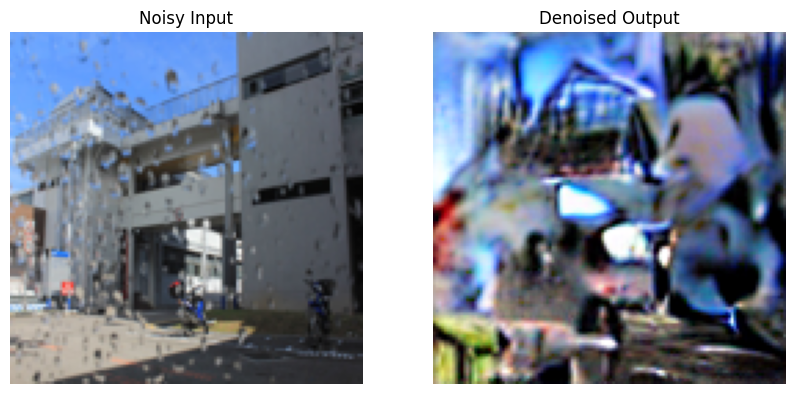

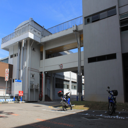

In [ ]:
import torch
from diffusers import AutoPipelineForImage2Image, UNet2DConditionModel
from PIL import Image
import numpy as np
from torchvision.transforms import ToTensor
import matplotlib.pyplot as plt

# ——— Configuration ———
BASE_MODEL     = "stable-diffusion-v1-5/stable-diffusion-v1-5"
CHECKPOINT_DIR = "/content/drive/MyDrive/Wise Research Project/derain.unet_attempt2/ep2"         # path to your fine‑tuned UNet
DEVICE         = "cuda"                  # or "cpu" if you don’t have a GPU
TEST_IMAGE     = "/content/drive/MyDrive/Wise Research Project/Nice Raindrop Dataset/test_a/data/12_rain.png"
OUTPUT_SIZE    = (128, 128)              # same as your training SIZE
PROMPT         = "help me derain"
STRENGTH       = 0.3
GUIDANCE_SCALE = 8.0
STEPS          = 50

# ——— 1) Load base img2img pipeline ———
pipe = AutoPipelineForImage2Image.from_pretrained(
    BASE_MODEL,variant="fp16", use_safetensors=True,
    torch_dtype=torch.float32
)

# ——— 2) Load and swap in your fine‑tuned UNet ———
fine_tuned_unet = UNet2DConditionModel.from_pretrained(
    CHECKPOINT_DIR,
    torch_dtype=torch.float32
)
pipe.unet = fine_tuned_unet
pipe = pipe.to(DEVICE)

# ——— 3) Prepare the input image ———
init_image = Image.open(TEST_IMAGE).convert("RGB").resize(OUTPUT_SIZE)
init_tensor = ToTensor()(init_image).unsqueeze(0).half().to(DEVICE)

# ——— 4) Run img2img inference ———
with torch.no_grad():
    result = pipe(
        prompt=PROMPT,
        image=init_tensor,
        strength=STRENGTH,
        guidance_scale=GUIDANCE_SCALE,
        num_inference_steps=STEPS
    ).images[0]

# ——— 5) Visualize the input vs. output ———
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title("Noisy Input")
plt.imshow(np.array(init_image))
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("Denoised Output")
plt.imshow(np.array(result))
plt.axis("off")

plt.show()

clean_image = Image.open("/content/drive/MyDrive/Wise Research Project/Nice Raindrop Dataset/test_a/gt/12_clean.png").convert("RGB").resize(OUTPUT_SIZE)
display(np.array(result))

# **Attempt 5: Rain Diffusion Code Continuing Training**

In [ ]:
#!pip install bitsandbytes
!pip install diffusers transformers torch torchvision accelerate bitsandbytes

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 88.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 73.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 48.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 15.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 74.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.9/72.9 MB 13.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstallin

In [ ]:
import os, torch
import torchvision.transforms as T
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from diffusers import AutoPipelineForImage2Image, DDPMScheduler, UNet2DConditionModel
from accelerate import Accelerator, DistributedDataParallelKwargs
from pathlib import Path
from tqdm import tqdm
import bitsandbytes as bnb


# ---- 超参 ----
SIZE, BATCH, ACC_STEPS =256, 1, 8 # og size = 512 将累积步数改为 32，完成 32 个批次后再进行一次反向传播
START_EPOCH, NUM_EPOCHS =  2, 1
LR, GUIDANCE = 1e-6, 4.0
MODEL_ID = "stable-diffusion-v1-5/stable-diffusion-v1-5"
RAIN_DIR = "/content/drive/MyDrive/Wise Research Project/Nice Raindrop Dataset/train/data"#change depending on account
CLEAN_DIR = "/content/drive/MyDrive/Wise Research Project/Nice Raindrop Dataset/train/gt"#change depending on account
SAVE_DIR = "/content/drive/MyDrive/Wise Research Project/derain_unet"
CHECKPOINT_DIR = "/content/drive/MyDrive/Wise Research Project/derain_unet/ep2"


def get_base_number(filename):
    import re
    match = re.match(r'(\d+)_', filename)  # Matches digits before underscore
    return match.group(1) if match else None

class RainPairs(Dataset):
    def __init__(self, rain_root: str, clean_root: str, size: int):
        # Convert input string paths to Path objects
        rainy_dir_path = Path(rain_root)
        clean_dir_path = Path(clean_root)

        self.rainy_paths = sorted(list(rainy_dir_path.glob('*_rain.png')))
        self.clean_paths = sorted(list(clean_dir_path.glob('*_clean.png')))

        # Ensure corresponding pairs exist and filter if necessary
        paired_paths = []
        for rainy_path in self.rainy_paths:
            base_num = get_base_number(rainy_path.name)
            if base_num:
                clean_filename = f"{base_num}_clean.png"
                clean_path = clean_dir_path / clean_filename
                if clean_path in self.clean_paths: # Check if the constructed clean path exists in the list of clean paths
                    paired_paths.append((rainy_path, clean_path))
                else:
                    print(f"Warning: Corresponding clean image not found for {rainy_path.name}. Skipping this pair.")
            else:
                 print(f"Warning: Could not parse base number from {rainy_path.name}. Skipping this pair.")

        # Update rainy_paths and clean_paths to only include the paired images
        self.rainy_paths = [p[0] for p in paired_paths]
        self.clean_paths = [p[1] for p in paired_paths]


        self.tf = transforms.Compose([
            transforms.Resize((size, size)),
            transforms.ToTensor(),
            transforms.Normalize([0.5]*3, [0.5]*3) # Normalize for 3 channels
        ])

    def __len__(self): return len(self.rainy_paths) # Return the number of paired images

    #get one sample/pair of images, idx =index/no. of sample
    def __getitem__(self, idx):
        rainy_path = self.rainy_paths[idx]
        clean_path = self.clean_paths[idx]

        r = Image.open(rainy_path).convert("RGB")
        c = Image.open(clean_path).convert("RGB")

        return self.tf(r), self.tf(c)

In [ ]:
def main(start_epoch = 0, num_epochs = NUM_EPOCHS, checkpoint_dir = None):
    accelerator = Accelerator(
        cpu=False,         # 默认就是 CPU -- changed to GPU cause wahaha
        mixed_precision="fp16",
        gradient_accumulation_steps=ACC_STEPS,
        kwargs_handlers=[DistributedDataParallelKwargs(find_unused_parameters=False)]
    )
    device = accelerator.device           # == cpu

    # ---- 加载基础管线（全部 float32）----
    pipe = AutoPipelineForImage2Image.from_pretrained(MODEL_ID).to(device)

    # ——— 2) Load and swap in your fine‑tuned UNet ———
    if checkpoint_dir:
       fine_tuned_unet = UNet2DConditionModel.from_pretrained(CHECKPOINT_DIR).to(device)
       pipe.unet = fine_tuned_unet
       accelerator.print(f"Loaded UNet from {checkpoint_dir}")
    else:
      accelerator.print("starting with base model")


    pipe.enable_attention_slicing()       # 仍可用
    pipe.enable_vae_tiling()
    pipe.vae.to("cpu")  # Offload to CPU bc/ frozen, not being trained
    pipe.text_encoder.to("cpu")

    unet, vae = pipe.unet, pipe.vae
    tokenizer, text_encoder = pipe.tokenizer, pipe.text_encoder
    scheduler = DDPMScheduler.from_config(pipe.scheduler.config)


    vae.requires_grad_(False); text_encoder.requires_grad_(False) #frozen, not being trained
    unet.train(); unet.enable_gradient_checkpointing()

    ds = RainPairs(RAIN_DIR, CLEAN_DIR, SIZE)
    loader = DataLoader(ds, batch_size=BATCH, shuffle=True, num_workers=0)

    optimizer = bnb.optim.AdamW8bit(unet.parameters(), lr=LR)
    #optimizer = torch.optim.AdamW(unet.parameters(), lr=LR)

    unet, optimizer, loader = accelerator.prepare(unet, optimizer, loader)



    # 固定提示
    prompt_ids = tokenizer("help me derain", padding="max_length",
                           max_length=tokenizer.model_max_length,
                           return_tensors="pt").input_ids.to(device) #tokenizes word prompt
    empty_ids  = tokenizer("", padding="max_length",
                           max_length=tokenizer.model_max_length,
                           return_tensors="pt").input_ids.to(device) #allow for unconditional guidance


    #training loop
    for ep in range(start_epoch + 1, start_epoch + num_epochs + 1): #next epoch to be trained and end of epochs

        total = 0
        pbar = tqdm(loader, desc=f"Epoch {ep} of {start_epoch + num_epochs}") #progress bar

        for rainy, clean in pbar:
            with accelerator.accumulate(unet):
                rainy, clean = rainy.to(device), clean.to(device)
                B = rainy.size(0)

                with torch.no_grad():
                  with accelerator.autocast(): #apply mixed precision fp16
                        txt = pipe.text_encoder(prompt_ids.repeat(B, 1).to("cpu")).last_hidden_state.to(device)
                        #move prompt processing to CPU for text encoding, move final tensor to CUDA
                        emp = pipe.text_encoder(empty_ids.repeat(B, 1).to("cpu")).last_hidden_state.to(device)
                        lat_c = pipe.vae.encode(clean.to("cpu")).latent_dist.sample().to(device) * 0.18215
                        lat_r = pipe.vae.encode(rainy.to("cpu")).latent_dist.sample().to(device) * 0.18215
                        #move clean image encoding to CPU, sample tensor back to GPU

                t = torch.randint(0, scheduler.config.num_train_timesteps, (B,), device=device).long() #random int between 0 and max timesteps
                noise = torch.randn_like(lat_c) #tensor with random noise same shape as latent clean representation
                lat_n = scheduler.add_noise(lat_c, noise, t) #creates noisy clean image by adding random noise according to random timestep

                model_in = lat_n + lat_r #model input is the noisy clean image and the rainy image

                with accelerator.autocast():#enable mix precision
                    eps_c = unet(model_in, t, encoder_hidden_states=txt).sample #UNet predicts the noise between the timestep and attempts to also derain
                    eps_u = unet(model_in, t, encoder_hidden_states=emp).sample #only noise prediction
                    eps = eps_u + GUIDANCE * (eps_c - eps_u) #final predicted noise biased with guidance factor towards the deraining
                    loss = torch.nn.functional.mse_loss(eps, noise) #mean squared error loss


                accelerator.backward(loss) #backward process to calc the gradients of the loss
                optimizer.step(); optimizer.zero_grad() #optimizer updates weight parameters then
                total += loss.detach()
                pbar.set_postfix(loss=f"{loss.item():.4f}")


        accelerator.print(f"Epoch {ep} completed. Loss: {total / len(loader):.4f}")
        if accelerator.is_main_process:
            #out = os.path.join(SAVE_DIR, f"ep{ep+1}")
            #os.makedirs(SAVE_DIR, exist_ok=True)
            out = Path(SAVE_DIR)
            out.mkdir(parents=True, exist_ok=True)
            epoch_save_dir = Path(SAVE_DIR) / f"ep{ep}"
            epoch_save_dir.mkdir(parents=True, exist_ok=True)
            accelerator.unwrap_model(unet).save_pretrained(epoch_save_dir)
            accelerator.print(f"✔ Saved UNet to {epoch_save_dir}")


main(START_EPOCH, NUM_EPOCHS, CHECKPOINT_DIR)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

config.json: 0.00B [00:00, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

safety_checker/model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loaded UNet from /content/drive/MyDrive/Wise Research Project/derain_unet/ep2


Epoch 3 of 3:  15%|█▌        | 133/861 [26:31<2:15:45, 11.19s/it, loss=0.1549]

Aug 6,2025

ok so in another attempt to keep colab running up, which is totally doing exactly what i want it too with the loss being actually quite high fgfdsffv idk ill just keep this one training  gesfcvsddrhhrjhh

# **Attempt 6: pix2pix Diffusion Model**

In [ ]:
!pip install diffusers accelerate safetensors transformers

In [ ]:
import PIL
import requests
import torch
from diffusers import StableDiffusionInstructPix2PixPipeline, EulerAncestralDiscreteScheduler
from PIL import Image
import numpy as np # Added import for plt
from torchvision.transforms import ToTensor # Added import




model_id = "timbrooks/instruct-pix2pix"
pipe = StableDiffusionInstructPix2PixPipeline.from_pretrained(model_id, torch_dtype=torch.float16, safety_checker=None)
pipe.to("cuda")
pipe.scheduler = EulerAncestralDiscreteScheduler.from_config(pipe.scheduler.config)

file_path = '/content/subset_train/data/111_rain.png'
init_image = Image.open(file_path).convert("RGB").resize((512, 512))

# Convert PIL Image to tensor, convert to float16, and move to GPU
init_image_tensor = ToTensor()(init_image).unsqueeze(0).half().to('cuda') # Convert, add batch dim, convert to float16, and move to cuda


url = "https://raw.githubusercontent.com/timothybrooks/instruct-pix2pix/main/imgs/example.jpg"
def download_image(url):
    image = PIL.Image.open(requests.get(url, stream=True).raw)
    image = PIL.ImageOps.exif_transpose(image)
    image = image.convert("RGB")
    return image
image = download_image(url)

prompt = "help me derain"
images = pipe(prompt, image=init_image, num_inference_steps=10, image_guidance_scale=1).images
images[0]


# **Extra Onions**

saving the deraining model parameters to download in case

In [ ]:
import shutil
import os
from pathlib import Path

# Define the directory to be zipped
source_dir = Path("/content/derain_unet")

# Define the name and location for the zip file
# This will create a zip file named "derain_unet.zip" in the /content directory
zip_filename = "/content/derain_unet.zip"

# Create the zip archive
print(f"Creating zip archive from {source_dir}...")
try:
    shutil.make_archive(zip_filename.replace('.zip', ''), 'zip', source_dir)
    print(f"Zip archive created successfully at {zip_filename}")

    # Instruct the user on how to download the file
    print("\nTo download the zip file to your computer:")
    print("1. Click the folder icon on the left sidebar.")
    print(f"2. Navigate to the `/content` directory.")
    print(f"3. Right-click on `{os.path.basename(zip_filename)}`.")
    print("4. Select 'Download'.")

except Exception as e:
    print(f"Error creating zip archive: {e}")

Creating zip archive from /content/derain_unet...
Zip archive created successfully at /content/derain_unet.zip

To download the zip file to your computer:
1. Click the folder icon on the left sidebar.
2. Navigate to the `/content` directory.
3. Right-click on `derain_unet.zip`.
4. Select 'Download'.


In [ ]:
import os
from pathlib import Path #filesystem paths
from tqdm import tqdm #display progress bars
import torch
import torch.nn.functional as F #loss functions MSE, convolution
import torchvision.transforms as T #convert image to tensors
from torch.utils.data import Dataset, DataLoader #DATASET PROCESSING
from PIL import Image
from diffusers import UNet2DModel, DDPMScheduler

# Config
train_root = Path("./Copy of test_a/test_a")       # data/ + gt/ input images and ground truth images
test_root = Path("./Copy of train/data")  # rainy TEST images
output_dir = Path("results")              # save denoised output images
ckpt_dir = Path("checkpoints")            # save/load model weights

# Training parameters
epochs = 50                                # total training iterations/repetitions
timesteps = 50                            # diffusion steps
batch_size = 4                             # training batch size each iteration
patch_size = 256                           # crop size for training (multiple of 16) speeed up
learning_rate = 1e-4                       # optimizer lr
use_amp = True                             # mixed precision speeed up

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = UNet2DModel.from_pretrained("runwayml/stable-diffusion-v1-5", subfolder="unet", cross_attention_dim=768)

model.config.in_channels = 6
model.config.out_channels = 3

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

ValueError: cross_attention_dim must be specified for CrossAttnDownBlock2D

In [ ]:
import diffusers
import os

print(f"Diffusers version: {diffusers.__version__}")

# List contents of the diffusers package directory
diffusers_path = os.path.dirname(diffusers.__file__)
print(f"\nContents of diffusers package directory ({diffusers_path}):")
print(os.listdir(diffusers_path))

Diffusers version: 0.34.0

Contents of diffusers package directory (/usr/local/lib/python3.11/dist-packages/diffusers):
['configuration_utils.py', 'hooks', 'commands', 'py.typed', 'callbacks.py', 'pipelines', 'loaders', 'models', 'quantizers', '__init__.py', 'utils', 'dependency_versions_check.py', 'optimization.py', 'training_utils.py', 'video_processor.py', 'experimental', 'schedulers', 'dependency_versions_table.py', 'image_processor.py', '__pycache__']


Plotting training and test loss
- learned many things abt overfitting and which models fit which dataset



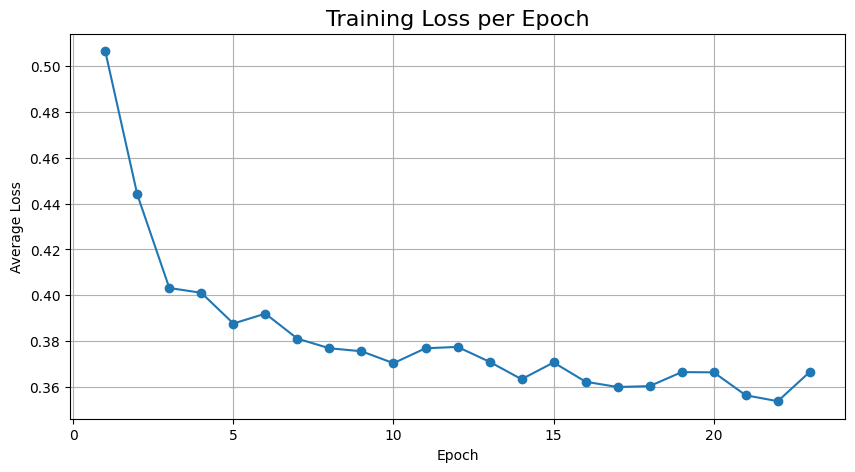

In [ ]:
import matplotlib.pyplot as plt

epoch_losses = [
    0.5065, 0.4440, 0.4032, 0.4011, 0.3877, 0.3920, 0.3811, 0.3769, 0.3756, 0.3704,
 0.3769, 0.3775, 0.3710, 0.3634, 0.3707, 0.3623, 0.3600, 0.3604, 0.3665, 0.3664,
 0.3564, 0.3538, 0.3666
]

epochs = len(epoch_losses) # Determine the number of epochs from the provided data

# Plot the loss over epochs
plt.figure(figsize=(10, 5)) # Adjust figure size for better print quality
plt.plot(range(1, epochs + 1), epoch_losses, marker='o', linestyle='-')
plt.title('Training Loss per Epoch', fontsize=16)
plt.xlabel('Epoch')
plt.ylabel('Average Loss')
plt.grid(True)
#plt.show() # Comment out plt.show() to save the figure instead

# Save the figure with high DPI
plt.savefig("training_loss.png", dpi=300) # Save with 300 DPI for high quality printing

Evaluating test loss for each epoch

In [ ]:
# evaluate_checkpoints.py

import os
import torch
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from diffusers import AutoPipelineForImage2Image, DDPMScheduler, UNet2DConditionModel
from accelerate import Accelerator # Import Accelerator
from pathlib import Path
from tqdm import tqdm
from PIL import Image

# --- Configuration ---
SIZE = 256 # Must match the size used during training
BATCH = 1 # Use a batch size of 1 for evaluation
RAIN_DIR = "/content/drive/MyDrive/Wise Research Project/Nice Raindrop Dataset/train/data" # Training data dir (used by RainPairs class)
CLEAN_DIR = "/content/drive/MyDrive/Wise Research Project/Nice Raindrop Dataset/train/gt" # Training gt dir (used by RainPairs class)
TEST_RAIN_DIR = "/content/drive/MyDrive/Wise Research Project/Nice Raindrop Dataset/test_a/data" # Test data directory
TEST_CLEAN_DIR = "/content/drive/MyDrive/Wise Research Project/Nice Raindrop Dataset/test_a/gt" # Test gt directory
SAVE_DIR = "/content/drive/MyDrive/Wise Research Project/derain_unet" # Directory where epoch checkpoints are saved
MODEL_ID = "stable-diffusion-v1-5/stable-diffusion-v1-5"
GUIDANCE = 4.0 # Must match the guidance scale used during training


def get_base_number(filename):
    import re
    match = re.match(r'(\d+)_', filename)  # Matches digits before underscore
    return match.group(1) if match else None

class RainPairs(Dataset):
    def __init__(self, rain_root: str, clean_root: str, size: int):
        # Convert input string paths to Path objects
        rainy_dir_path = Path(rain_root)
        clean_dir_path = Path(clean_root)

        self.rainy_paths = sorted(list(rainy_dir_path.glob('*_rain.png')))
        self.clean_paths = sorted(list(clean_dir_path.glob('*_clean.png')))

        # Ensure corresponding pairs exist and filter if necessary
        paired_paths = []
        for rainy_path in self.rainy_paths:
            base_num = get_base_number(rainy_path.name)
            if base_num:
                clean_filename = f"{base_num}_clean.png"
                clean_path = clean_dir_path / clean_filename
                if clean_path in self.clean_paths: # Check if the constructed clean path exists in the list of clean paths
                    paired_paths.append((rainy_path, clean_path))
                else:
                    print(f"Warning: Corresponding clean image not found for {rainy_path.name}. Skipping this pair.")
            else:
                 print(f"Warning: Could not parse base number from {rainy_path.name}. Skipping this pair.")

        # Update rainy_paths and clean_paths to only include the paired images
        self.rainy_paths = [p[0] for p in paired_paths]
        self.clean_paths = [p[1] for p in paired_paths]


        self.tf = transforms.Compose([
            transforms.Resize((size, size)),
            transforms.ToTensor(),
            transforms.Normalize([0.5]*3, [0.5]*3) # Normalize for 3 channels
        ])

    def __len__(self): return len(self.rainy_paths) # Return the number of paired images

    #get one sample/pair of images, idx =index/no. of sample
    def __getitem__(self, idx):
        rainy_path = self.rainy_paths[idx]
        clean_path = self.clean_paths[idx]

        r = Image.open(rainy_path).convert("RGB")
        c = Image.open(clean_path).convert("RGB")

        return self.tf(r), self.tf(c)


def evaluate_checkpoint(checkpoint_path, test_loader, pipe, accelerator, prompt_ids, empty_ids, scheduler, device):
    # Load the fine-tuned UNet model
    try:
        fine_tuned_unet = UNet2DConditionModel.from_pretrained(checkpoint_path)
        pipe.unet = fine_tuned_unet.to(device)
        pipe.unet.eval() # Set UNet to evaluation mode
    except Exception as e:
        print(f"Error loading checkpoint {checkpoint_path}: {e}")
        return None

    total_test_loss = 0
    pbar_test = tqdm(test_loader, desc=f"Evaluating {os.path.basename(checkpoint_path)}")

    with torch.no_grad():
        for rainy, clean in pbar_test:
            rainy, clean = rainy.to(device), clean.to(device)
            B = rainy.size(0)

            with accelerator.autocast():  # Use autocast for mixed precision
                txt = pipe.text_encoder(prompt_ids.repeat(B, 1).to("cpu")).last_hidden_state.to(device)
                emp = pipe.text_encoder(empty_ids.repeat(B, 1).to("cpu")).last_hidden_state.to(device)
                lat_c = pipe.vae.encode(clean.to("cpu")).latent_dist.sample().to(device) * 0.18215
                lat_r = pipe.vae.encode(rainy.to("cpu")).latent_dist.sample().to(device) * 0.18215

                t = torch.randint(0, scheduler.config.num_train_timesteps, (B,), device=device).long()
                noise = torch.randn_like(lat_c)
                lat_n = scheduler.add_noise(lat_c, noise, t)

                model_in = lat_n + lat_r

                eps_c = pipe.unet(model_in, t, encoder_hidden_states=txt).sample
                eps_u = pipe.unet(model_in, t, encoder_hidden_states=emp).sample
                eps = eps_u + GUIDANCE * (eps_c - eps_u)

                loss = torch.nn.functional.mse_loss(eps, noise)
                total_test_loss += loss.detach()
                pbar_test.set_postfix(loss=f"{loss.item():.4f}")

    return total_test_loss / len(test_loader)


def main():
    accelerator = Accelerator(mixed_precision="fp16") # Use Accelerator for mixed precision
    device = accelerator.device

    # Load base pipeline components
    pipe = AutoPipelineForImage2Image.from_pretrained(MODEL_ID).to(device)
    pipe.enable_attention_slicing()
    pipe.enable_vae_tiling()
    pipe.vae.to("cpu")  # Offload to CPU
    pipe.text_encoder.to("cpu")

    tokenizer = pipe.tokenizer
    scheduler = DDPMScheduler.from_config(pipe.scheduler.config)

    # Prepare test DataLoader
    test_ds = RainPairs(TEST_RAIN_DIR, TEST_CLEAN_DIR, SIZE)
    test_loader = DataLoader(test_ds, batch_size=BATCH, shuffle=False, num_workers=0)
    test_loader = accelerator.prepare(test_loader) # Prepare test_loader with Accelerator

    # Prepare fixed prompts
    prompt_ids = tokenizer("help me derain", padding="max_length",
                           max_length=tokenizer.model_max_length,
                           return_tensors="pt").input_ids.to(device)
    empty_ids  = tokenizer("", padding="max_length",
                           max_length=tokenizer.model_max_length,
                           return_tensors="pt").input_ids.to(device)

    # Find all epoch checkpoints
    checkpoint_dirs = sorted([d for d in Path(SAVE_DIR).iterdir() if d.is_dir() and d.name.startswith('ep')])

    test_losses = []
    epoch_numbers = []

    for checkpoint_dir in checkpoint_dirs:
        print(f"\n--- Evaluating {checkpoint_dir} ---")
        avg_test_loss = evaluate_checkpoint(checkpoint_dir, test_loader, pipe, accelerator, prompt_ids, empty_ids, scheduler, device) # Pass accelerator
        if avg_test_loss is not None:
            test_losses.append(avg_test_loss.item())
            try:
                epoch_number = int(checkpoint_dir.name.replace('ep', ''))
                epoch_numbers.append(epoch_number)
            except ValueError:
                epoch_numbers.append(len(epoch_numbers) + 1) # Use a counter if naming is inconsistent

    print("\n--- Evaluation Complete ---")
    print("Epoch Test Losses:")
    for epoch, loss in zip(epoch_numbers, test_losses):
        print(f"Epoch {epoch}: {loss:.4f}")

    # You can now use epoch_numbers and test_losses to plot the test loss

if __name__ == "__main__":
    main()

In [ ]:
# To run the evaluation script, save the code above as a .py file (e.g., evaluate_checkpoints.py)
# and run it from your terminal or another code cell in Colab using:
# !python evaluate_checkpoints.py

# After running the script, you can manually enter the printed test_losses into your plotting code
# or modify the script to save the losses to a file that your plotting code can read.

# Example of how you might update your plotting cell (replace with your actual train_losses):
# import matplotlib.pyplot as plt

# train_losses = [...] # Your collected training losses
# test_losses = [...] # The test losses printed by the evaluation script

# # Ensure epoch_numbers match the number of losses
# epoch_numbers = range(1, len(train_losses) + 1) # Or load from a file if saved by the script

# plt.figure(figsize=(10, 6))
# plt.plot(epoch_numbers, train_losses, marker='o', linestyle='-', label='Training Loss')
# plt.plot(epoch_numbers, test_losses, marker='o', linestyle='-', label='Test Loss')
# plt.title('Training and Test Loss per Epoch')
# plt.xlabel('Epoch')
# plt.ylabel('Average Loss')
# plt.grid(True)
# plt.legend()
# plt.show()

## Visualize `model_input`

In [ ]:
import torch
import torchvision.transforms as T
from PIL import Image
from diffusers import AutoPipelineForImage2Image, DDPMScheduler
from accelerate import Accelerator
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
import torchvision.transforms as transforms # Import the transforms module

# --- Configuration (must match training configuration) ---
SIZE = 256
MODEL_ID = "stable-diffusion-v1-5/stable-diffusion-v1-5" # Base model ID
RAIN_IMAGE_PATH = "/content/drive/MyDrive/Wise Research Project/Nice Raindrop Dataset/train/data/35_rain.png" # Path to a sample rainy image
CLEAN_IMAGE_PATH = "/content/drive/MyDrive/Wise Research Project/Nice Raindrop Dataset/train/gt/35_clean.png" # Path to the corresponding clean image

# --- Data Loading and Preprocessing (from your RainPairs class) ---
def load_and_preprocess_image(image_path, size):
    img = Image.open(image_path).convert("RGB")
    tf = transforms.Compose([
        transforms.Resize((size, size)),
        transforms.ToTensor(),
        transforms.Normalize([0.5]*3, [0.5]*3) # Normalize for 3 channels
    ])
    return tf(img)

rainy_tensor = load_and_preprocess_image(RAIN_IMAGE_PATH, SIZE).unsqueeze(0) # Add batch dimension
clean_tensor = load_and_preprocess_image(CLEAN_IMAGE_PATH, SIZE).unsqueeze(0) # Add batch dimension

# --- Replicate steps to get model_in ---
# Initialize necessary components (similar to your main training function)
accelerator = Accelerator(mixed_precision="fp16")
device = accelerator.device

# Load base pipeline components and move required parts to CPU
pipe = AutoPipelineForImage2Image.from_pretrained(MODEL_ID).to(device)
pipe.vae.to("cpu")
pipe.text_encoder.to("cpu")

scheduler = DDPMScheduler.from_config(pipe.scheduler.config)

# Move tensors to device
rainy_tensor = rainy_tensor.to(device)
clean_tensor = clean_tensor.to(device)

# Replicate the model_in generation within no_grad and autocast
with torch.no_grad():
    with accelerator.autocast():
        lat_c = pipe.vae.encode(clean_tensor.to("cpu")).latent_dist.sample().to(device) * 0.18215
        lat_r = pipe.vae.encode(rainy_tensor.to("cpu")).latent_dist.sample().to(device) * 0.18215

    # Select a random timestep (can be any valid timestep for visualization)
    t = torch.randint(0, scheduler.config.num_train_timesteps, (1,), device=device).long()

    noise = torch.randn_like(lat_c)
    lat_n = scheduler.add_noise(lat_c, noise, t)

    model_in = lat_n + lat_r

# --- Visualize model_in ---
print("Visualizing model_in:")

# Separate the concatenated tensor
# model_in has shape [batch_size, 6, height, width]
# Note: model_in is in latent space, so visualizing directly might not be interpretable as images.
# However, based on the user's request to see the 'noisy clean' and 'rainy' parts
# concatenated in model_in, we'll attempt to display the two 3-channel parts separately.
# Keep in mind these are not standard image pixels but latent representations.

noisy_clean_latent = model_in[:, :3, :, :] # First 3 channels are noisy clean latent
rainy_latent = model_in[:, 3:, :, :]     # Next 3 channels are rainy latent

# Denormalize the latent representations
# Assuming the normalization was scaling to [-1, 1] for the input images (before VAE encoding),
# and VAE encoding scales by 0.18215.
# The denormalization for latent space is complex and depends on the VAE.
# For visualization purposes, we can simply scale from the latent range back to approximately [0, 1]
# or [-1, 1] and then to [0, 255] for PIL.
# Since the latent values can be outside a typical image range, clamping is necessary.

# Simple scaling for visualization purposes (not a true VAE decode)
def scale_for_display(tensor):
    # Scale from latent range (approx -2 to 2) to [0, 1]
    # These ranges are approximate and can vary
    min_val = tensor.min()
    max_val = tensor.max()
    scaled_tensor = (tensor - min_val) / (max_val - min_val)
    return scaled_tensor


# Convert to PIL Images for display
# Need to remove batch dimension and move back to CPU for PIL
# Apply scaling before converting to PIL
noisy_clean_img_pil = transforms.ToPILImage()(scale_for_display(noisy_clean_latent[0].cpu()))
rainy_img_pil = transforms.ToPILImage()(scale_for_latent(rainy_latent[0].cpu())) # Use scale_for_latent for rainy image

print("Noisy Clean Latent (part of model_in):")
display(noisy_clean_img_pil)

print("Rainy Latent (part of model_in):")
display(rainy_img_pil)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Visualizing model_in:


NameError: name 'scale_for_latent' is not defined

In [ ]:
import torch
from diffusers import UNet2DConditionModel
from pathlib import Path

# --- Configuration ---
# Replace with the path to one of your saved epoch checkpoints
CHECKPOINT_DIR = "/content/drive/MyDrive/Wise Research Project/derain_unet/ep2"

# Load the fine-tuned UNet model
try:
    fine_tuned_unet = UNet2DConditionModel.from_pretrained(CHECKPOINT_DIR)
    print(f"Successfully loaded UNet model from {CHECKPOINT_DIR}")

    # Print the model structure
    print("\nUNet Model Structure:")
    print(fine_tuned_unet)

except Exception as e:
    print(f"Error loading model from {CHECKPOINT_DIR}: {e}")
    print("Please ensure the CHECKPOINT_DIR path is correct and contains a saved UNet model.")

Successfully loaded UNet model from /content/drive/MyDrive/Wise Research Project/derain_unet/ep2

UNet Model Structure:
UNet2DConditionModel(
  (conv_in): Conv2d(4, 320, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=320, out_features=1280, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=1280, out_features=1280, bias=True)
  )
  (down_blocks): ModuleList(
    (0): CrossAttnDownBlock2D(
      (attentions): ModuleList(
        (0-1): 2 x Transformer2DModel(
          (norm): GroupNorm(32, 320, eps=1e-06, affine=True)
          (proj_in): Conv2d(320, 320, kernel_size=(1, 1), stride=(1, 1))
          (transformer_blocks): ModuleList(
            (0): BasicTransformerBlock(
              (norm1): LayerNorm((320,), eps=1e-05, elementwise_affine=True)
              (attn1): Attention(
                (to_q): Linear(in_features=320, out_features=320, bias=False)
            